In [1]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import os
os.environ["CUDA_VISIBLE_DEVICES"]="3"

### image show funcitons

In [2]:
def show_img(image):
    img = image.detach().cpu()
    img = img.squeeze(0)
    img = torch.clamp(img, 0, 1)
    plt.imshow(img.permute(1, 2, 0))
    
def final_show(image):
    img = image.detach().cpu()
    img = img.squeeze(0)
    img = img * torch.tensor([0.229, 0.224, 0.225]).view(-1,1,1) + torch.tensor([0.485, 0.456, 0.406]).view(-1,1,1)
    img = torch.clamp(img, 0, 1)
    plt.imshow(img.permute(1, 2, 0))

def reverse_norm(image):
    img = image.detach().cpu()
    img = img.squeeze(0)
    img = img * torch.tensor([0.229, 0.224, 0.225]).view(-1,1,1) + torch.tensor([0.485, 0.456, 0.406]).view(-1,1,1)
    img = torch.clamp(img, 0, 1)
    img = img.permute(1, 2, 0)
    return img

def final_compare_show(content_img, style_img, combine_img):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,5))
    ax1.imshow(reverse_norm(content_img))
    ax1.set_title('content image')
    ax1.set_axis_off()
    
    ax2.imshow(reverse_norm(style_img))
    ax2.set_title('style image')
    ax2.set_axis_off()
    
    ax3.imshow(reverse_norm(combine_img))
    ax3.set_title('transfer image')
    ax3.set_axis_off()
    

### content loss and style loss

In [3]:
def nst_loss(content_features, style_features, combine_features, content_layers, style_layers, style_weights):
    
    content_loss, style_loss = 0, 0
    for layer in content_layers:
        #content_loss += torch.sum((combine_features[layer] - content_features[layer])**2) / 2
        content_loss += torch.mean((combine_features[layer] - content_features[layer])**2) ### find the use 'mean' is easy for tuning parameters here
  
    for idx, layer in enumerate(style_layers):
        style_b, style_c, style_h, style_w = style_features[layer].shape
        combine_b, combine_c, combine_h, combine_w = combine_features[layer].shape
        assert style_b * style_c == combine_b * combine_c
        assert style_h * style_w == combine_h * combine_w
        
        style_feature = style_features[layer].view(style_b * style_c, style_h * style_w)
        combine_feature = combine_features[layer].view(combine_b * combine_c, combine_h * combine_w)
        
        style_gram = torch.mm(style_feature, style_feature.t())
        combine_gram = torch.mm(combine_feature, combine_feature.t())
        style_loss += style_weights[idx] * torch.sum((combine_gram-style_gram) ** 2) / (4 * ((style_b*style_c)**2) * ((style_h*style_w)**2))
        
    return content_loss, style_loss

### Image Loader

In [4]:
normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

def image_loader(image):
    transformer = transforms.Compose([
        transforms.Resize((512, 512)),
        transforms.ToTensor(),
        normalize
    ])
    return transformer(image).unsqueeze(0)

### extract content, style features

In [5]:
layers_name = {0:'conv1_1', 2:'conv1_2', 
               5:'conv2_1', 7:'conv2_2', 
               10:'conv3_1', 12:'conv3_2', 14:'conv3_3', 16:'conv3_4', 
               19:'conv4_1', 21:'conv4_2', 23:'conv4_3', 25:'conv4_4',
               28:'conv5_1', 30:'conv5_2', 32:'conv5_3', 34:'conv5_4'}

In [6]:
def get_features(name, features):
    def hook(model, input, output):
        features[name] = output
        return output
    return hook

In [7]:
def content_style_features(layers_name, style_img, content_img, features):
    model = models.vgg19(pretrained=True)
    
    for idx, layer in enumerate(model.features):
        if idx in layers_name.keys():
            layer.register_forward_hook(get_features(layers_name[idx], features))
        
    model.cuda()
    model.eval()

    model(style_img)
    style_features = {}
    for key, value in features.items():
        style_features[key] = value.detach()
    model(content_img)
    content_features = {}
    for key, value in features.items():
        content_features[key] = value.detach()
        
    return model, content_features, style_features

### style transfer train

In [8]:
def style_transfer_train(model, features, combine_img,
                         cotent_features, style_features, conctent_layers, style_layers, 
                         learning_rate, max_epoch, alpha, beta, style_weight):
    
    combine_img.requires_grad = True

    optimizer = torch.optim.Adam([combine_img], lr=learning_rate)

    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, max_epoch)

    for ep in range(max_epoch):
    
        model(combine_img)
        combine_features = features.copy()
        
        content_loss, style_loss = nst_loss(content_features, style_features, combine_features, content_layers, style_layers, style_weight)
        total_loss = alpha * content_loss + beta * style_loss
       
        optimizer.zero_grad()
        total_loss.backward()
        if ep % 100 == 0:
            print('EP %d; Total Loss: %.5f; Content Loss: %.5f; Style Loss: %.5f' % 
                  (ep, total_loss, alpha * content_loss, beta * style_loss))
    
        optimizer.step()
    
    return combine_img

## Experiments

#### starry_night

In [65]:
style_image = Image.open('./style/starry_night.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 47.96322; Content Loss: 0.00000; Style Loss: 47.96322
EP 100; Total Loss: 7.92779; Content Loss: 4.27132; Style Loss: 3.65647
EP 200; Total Loss: 4.92913; Content Loss: 3.03751; Style Loss: 1.89162
EP 300; Total Loss: 4.12729; Content Loss: 2.68214; Style Loss: 1.44515
EP 400; Total Loss: 3.78462; Content Loss: 2.53159; Style Loss: 1.25302


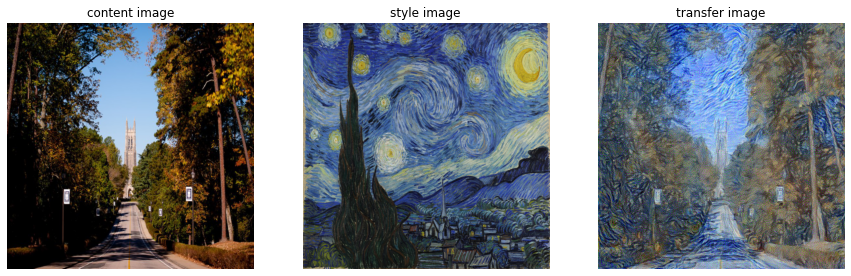

In [15]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 125
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 76.74115; Content Loss: 0.00000; Style Loss: 76.74115
EP 100; Total Loss: 10.64652; Content Loss: 5.44728; Style Loss: 5.19924
EP 200; Total Loss: 6.34177; Content Loss: 3.88164; Style Loss: 2.46013
EP 300; Total Loss: 5.16553; Content Loss: 3.40605; Style Loss: 1.75948
EP 400; Total Loss: 4.65356; Content Loss: 3.11311; Style Loss: 1.54046


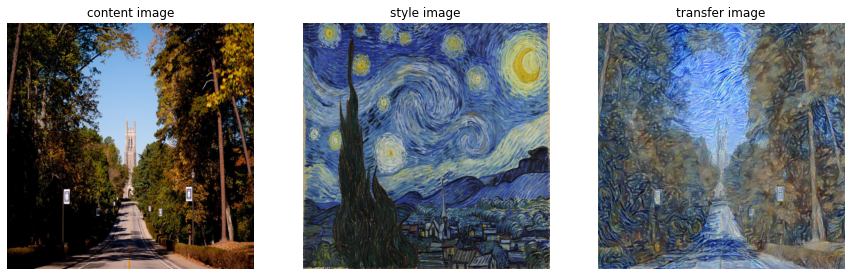

In [17]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 200
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 191.85287; Content Loss: 0.00000; Style Loss: 191.85287
EP 100; Total Loss: 19.16009; Content Loss: 7.96712; Style Loss: 11.19297
EP 200; Total Loss: 10.55233; Content Loss: 5.98332; Style Loss: 4.56901
EP 300; Total Loss: 8.14062; Content Loss: 5.23427; Style Loss: 2.90634
EP 400; Total Loss: 7.05277; Content Loss: 4.79970; Style Loss: 2.25307


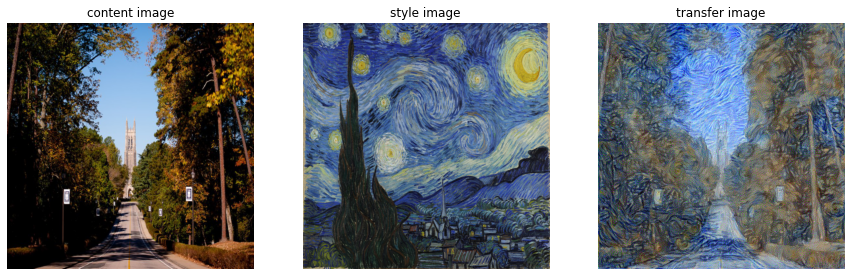

In [41]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 112.93890; Content Loss: 0.00000; Style Loss: 112.93890
EP 100; Total Loss: 21.28148; Content Loss: 7.88750; Style Loss: 13.39398
EP 200; Total Loss: 11.35528; Content Loss: 5.95166; Style Loss: 5.40362
EP 300; Total Loss: 8.68259; Content Loss: 5.14131; Style Loss: 3.54128
EP 400; Total Loss: 7.52748; Content Loss: 4.76912; Style Loss: 2.75837


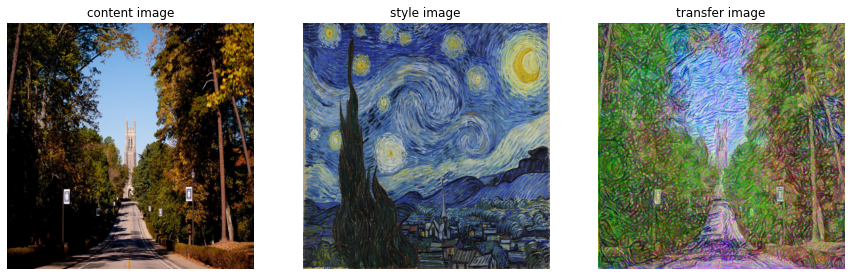

In [69]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv2_1', 
                'conv3_1', 
                'conv4_1',
                'conv5_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 125
style_weight = [0.1,0.1,0.2,0.3,0.3]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 11.18294; Content Loss: 8.45383; Style Loss: 2.72910
EP 100; Total Loss: 1.45439; Content Loss: 0.72104; Style Loss: 0.73335
EP 200; Total Loss: 1.60977; Content Loss: 0.85240; Style Loss: 0.75736
EP 300; Total Loss: 2.17157; Content Loss: 1.17865; Style Loss: 0.99292
EP 400; Total Loss: 2.70255; Content Loss: 1.41189; Style Loss: 1.29066


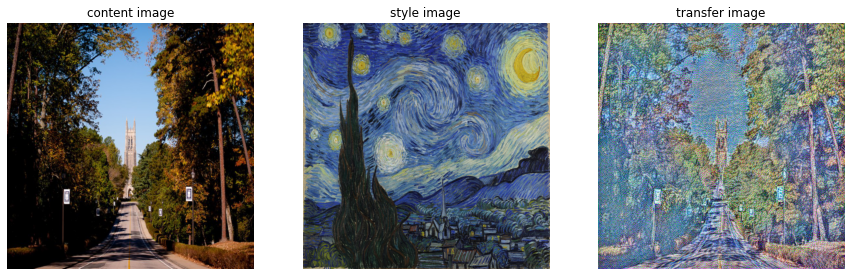

In [23]:
combine_img = torch.rand(content_img.shape).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 5
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

#### Composition

In [76]:
style_image = Image.open('./style/Composition.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 283.34338; Content Loss: 0.00000; Style Loss: 283.34338
EP 100; Total Loss: 24.73615; Content Loss: 10.10739; Style Loss: 14.62876
EP 200; Total Loss: 14.33119; Content Loss: 8.03509; Style Loss: 6.29610
EP 300; Total Loss: 11.46005; Content Loss: 7.13801; Style Loss: 4.32205
EP 400; Total Loss: 9.98386; Content Loss: 6.59592; Style Loss: 3.38794


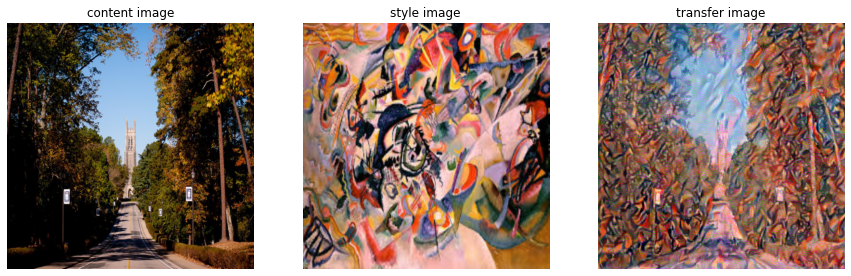

In [49]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 160.10570; Content Loss: 0.00000; Style Loss: 160.10570
EP 100; Total Loss: 31.15957; Content Loss: 9.78228; Style Loss: 21.37729
EP 200; Total Loss: 14.82389; Content Loss: 7.82111; Style Loss: 7.00278
EP 300; Total Loss: 11.00192; Content Loss: 6.80609; Style Loss: 4.19583
EP 400; Total Loss: 9.31216; Content Loss: 6.19144; Style Loss: 3.12072


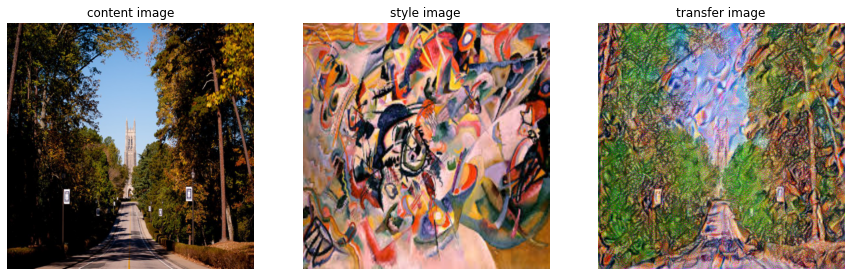

In [77]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv2_1', 
                'conv3_1', 
                'conv4_1',
                'conv5_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 125
style_weight = [0.1,0.1,0.2,0.3,0.3]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

#### seated-nude

In [74]:
style_image = Image.open('./style/seated-nude-femme-nue-assise-pablo-picasso-1909-f9095482.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 291.35547; Content Loss: 0.00000; Style Loss: 291.35547
EP 100; Total Loss: 19.82592; Content Loss: 5.98508; Style Loss: 13.84084
EP 200; Total Loss: 10.14958; Content Loss: 4.35059; Style Loss: 5.79899
EP 300; Total Loss: 7.50020; Content Loss: 3.79529; Style Loss: 3.70491
EP 400; Total Loss: 6.24657; Content Loss: 3.50264; Style Loss: 2.74393


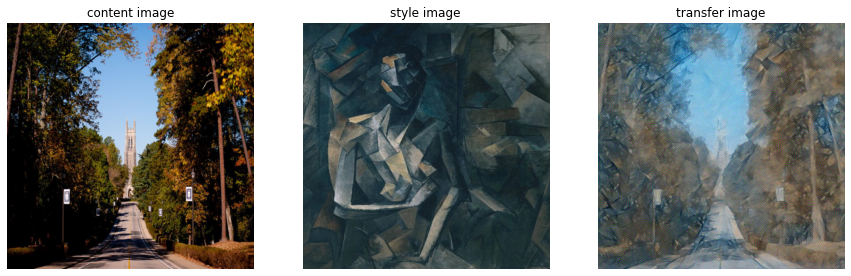

In [43]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 154.33344; Content Loss: 0.00000; Style Loss: 154.33344
EP 100; Total Loss: 21.68582; Content Loss: 6.49188; Style Loss: 15.19394
EP 200; Total Loss: 10.59130; Content Loss: 4.85952; Style Loss: 5.73178
EP 300; Total Loss: 7.49331; Content Loss: 4.09040; Style Loss: 3.40291
EP 400; Total Loss: 6.08328; Content Loss: 3.65064; Style Loss: 2.43264


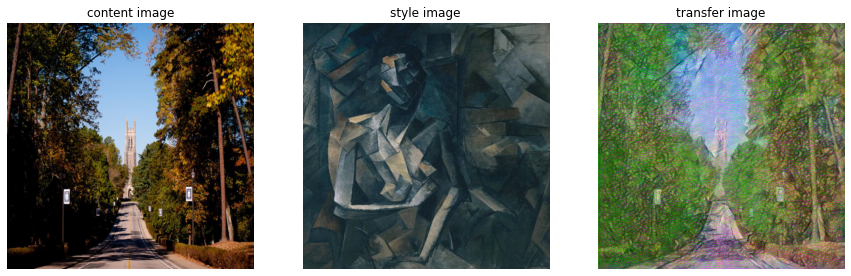

In [75]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv2_1', 
                'conv3_1', 
                'conv4_1',
                'conv5_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 125
style_weight = [0.1,0.1,0.2,0.3,0.3]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

#### the shipwreck of the minotaur

In [72]:
style_image = Image.open('./style/the_shipwreck_of_the_minotaur.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 152.83156; Content Loss: 0.00000; Style Loss: 152.83156
EP 100; Total Loss: 14.99990; Content Loss: 5.50877; Style Loss: 9.49113
EP 200; Total Loss: 7.75518; Content Loss: 3.65603; Style Loss: 4.09915
EP 300; Total Loss: 5.78944; Content Loss: 3.07749; Style Loss: 2.71195
EP 400; Total Loss: 4.88180; Content Loss: 2.78536; Style Loss: 2.09644


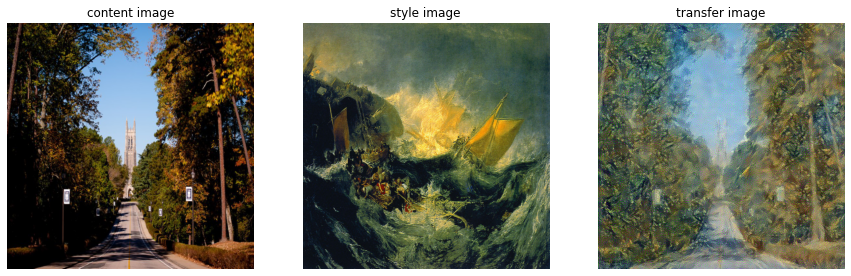

In [45]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',
                ]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 86.81259; Content Loss: 0.00000; Style Loss: 86.81259
EP 100; Total Loss: 18.06518; Content Loss: 5.80420; Style Loss: 12.26098
EP 200; Total Loss: 8.40868; Content Loss: 3.89021; Style Loss: 4.51847
EP 300; Total Loss: 5.83786; Content Loss: 3.10069; Style Loss: 2.73718
EP 400; Total Loss: 4.71143; Content Loss: 2.69510; Style Loss: 2.01633


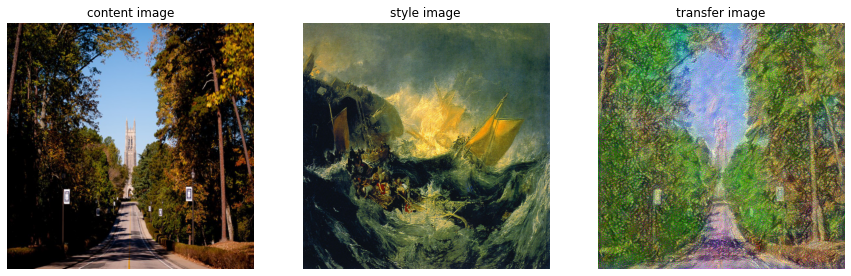

In [73]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv2_1', 
                'conv3_1', 
                'conv4_1',
                'conv5_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 125
style_weight = [0.1,0.1,0.2,0.3,0.3]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

#### der schrei munch museum oslo

In [70]:
style_image = Image.open('./style/der-schrei-munch-museum-oslo.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 255.14046; Content Loss: 0.00000; Style Loss: 255.14046
EP 100; Total Loss: 21.66433; Content Loss: 8.23551; Style Loss: 13.42882
EP 200; Total Loss: 11.78084; Content Loss: 6.54496; Style Loss: 5.23588
EP 300; Total Loss: 9.34516; Content Loss: 5.84096; Style Loss: 3.50420
EP 400; Total Loss: 8.14639; Content Loss: 5.39947; Style Loss: 2.74692


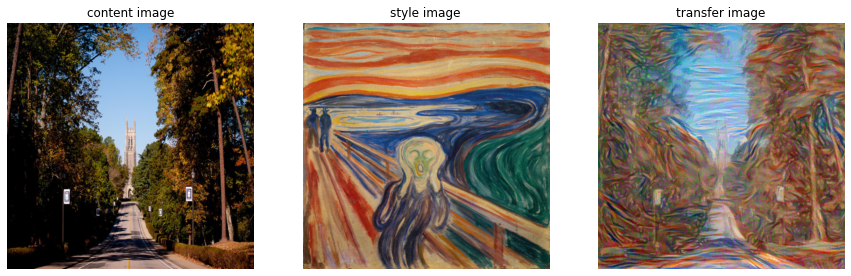

In [47]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',
                ]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

EP 0; Total Loss: 144.00601; Content Loss: 0.00000; Style Loss: 144.00601
EP 100; Total Loss: 27.90781; Content Loss: 8.01993; Style Loss: 19.88787
EP 200; Total Loss: 13.21121; Content Loss: 6.30357; Style Loss: 6.90764
EP 300; Total Loss: 9.64521; Content Loss: 5.51892; Style Loss: 4.12629
EP 400; Total Loss: 8.08855; Content Loss: 5.06075; Style Loss: 3.02780


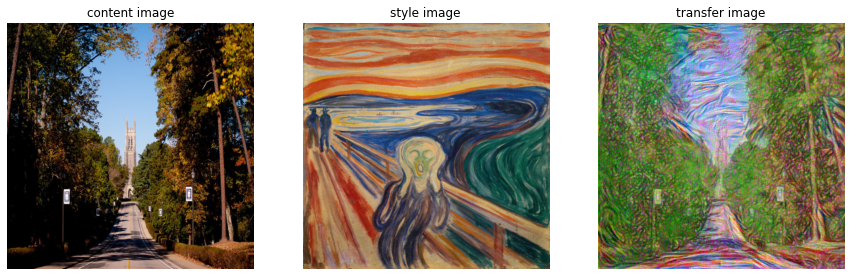

In [71]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv2_1', 
                'conv3_1', 
                'conv4_1',
                'conv5_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 125
style_weight = [0.1,0.1,0.2,0.3,0.3]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

### complexity

In [55]:
style_image = Image.open('./style/the_shipwreck_of_the_minotaur.jpeg')
content_image = Image.open('./content/duke_flag.jpeg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 154.97499; Content Loss: 0.00000; Style Loss: 154.97499
EP 100; Total Loss: 10.29033; Content Loss: 4.80139; Style Loss: 5.48894
EP 200; Total Loss: 6.56644; Content Loss: 3.71119; Style Loss: 2.85526
EP 300; Total Loss: 5.48169; Content Loss: 3.35191; Style Loss: 2.12978
EP 400; Total Loss: 4.92071; Content Loss: 3.15968; Style Loss: 1.76103


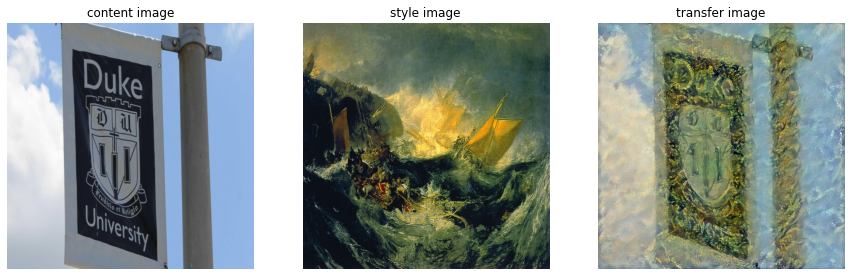

In [56]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

In [51]:
style_image = Image.open('./style/starry_night.jpeg')
content_image = Image.open('./content/duke_flag.jpeg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 218.26022; Content Loss: 0.00000; Style Loss: 218.26022
EP 100; Total Loss: 12.08223; Content Loss: 6.02737; Style Loss: 6.05485
EP 200; Total Loss: 7.96028; Content Loss: 4.70300; Style Loss: 3.25728
EP 300; Total Loss: 6.76311; Content Loss: 4.35976; Style Loss: 2.40335
EP 400; Total Loss: 7.52139; Content Loss: 4.69787; Style Loss: 2.82352


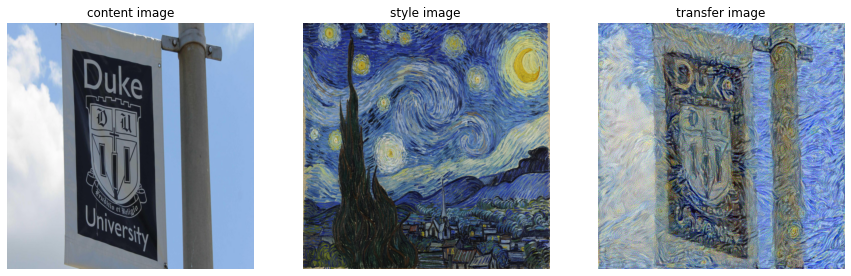

In [52]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

In [53]:
style_image = Image.open('./style/der-schrei-munch-museum-oslo.jpeg')
content_image = Image.open('./content/duke_flag.jpeg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 155.66750; Content Loss: 0.00000; Style Loss: 155.66750
EP 100; Total Loss: 13.32516; Content Loss: 5.74800; Style Loss: 7.57716
EP 200; Total Loss: 8.06455; Content Loss: 4.48398; Style Loss: 3.58057
EP 300; Total Loss: 6.74675; Content Loss: 4.09116; Style Loss: 2.65559
EP 400; Total Loss: 6.49218; Content Loss: 3.98534; Style Loss: 2.50684


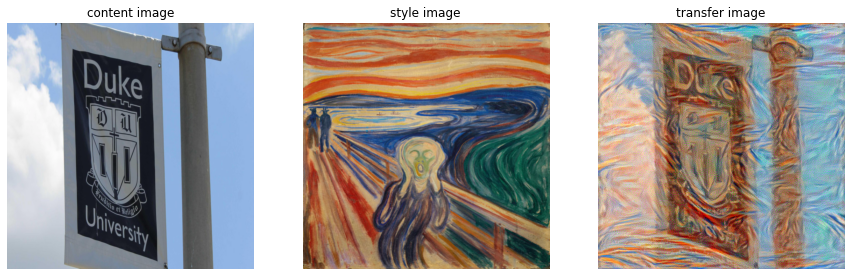

In [54]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',
                ]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

### Different Layers

In [57]:
style_image = Image.open('./style/starry_night.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 191.85287; Content Loss: 0.00000; Style Loss: 191.85287
EP 100; Total Loss: 19.30899; Content Loss: 9.03095; Style Loss: 10.27804
EP 200; Total Loss: 10.90161; Content Loss: 7.08805; Style Loss: 3.81356
EP 300; Total Loss: 7.87851; Content Loss: 5.62199; Style Loss: 2.25652
EP 400; Total Loss: 6.23109; Content Loss: 4.62693; Style Loss: 1.60416


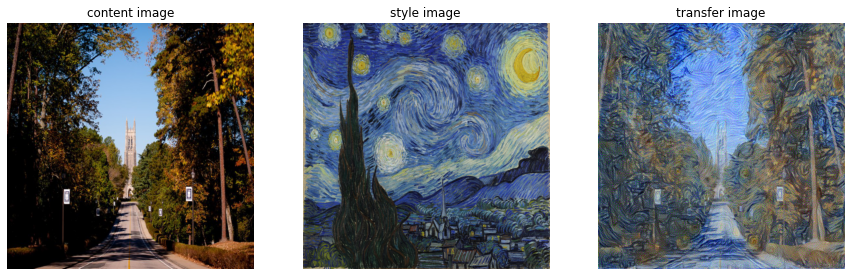

In [64]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv2_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

In [59]:
style_image = Image.open('./style/starry_night.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 191.85287; Content Loss: 0.00000; Style Loss: 191.85287
EP 100; Total Loss: 25.36368; Content Loss: 14.27186; Style Loss: 11.09182
EP 200; Total Loss: 14.20871; Content Loss: 9.64333; Style Loss: 4.56537
EP 300; Total Loss: 10.56489; Content Loss: 7.68612; Style Loss: 2.87876
EP 400; Total Loss: 8.90610; Content Loss: 6.68480; Style Loss: 2.22130


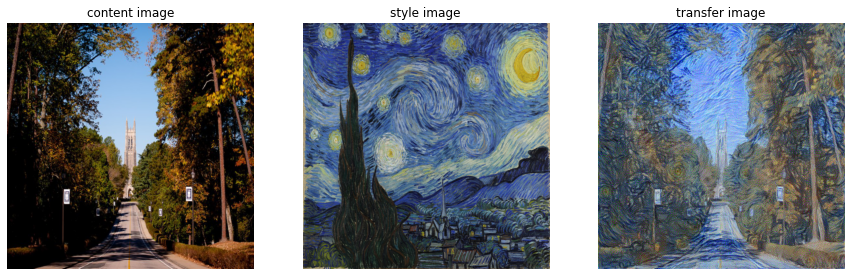

In [60]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv3_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)

In [61]:
style_image = Image.open('./style/starry_night.jpeg')
content_image = Image.open('./content/duke_chapel.jpg')
style_img = image_loader(style_image).cuda()
content_img = image_loader(content_image).cuda()
features = {}

model, content_features, style_features = content_style_features(layers_name, style_img, content_img, features)

EP 0; Total Loss: 191.85287; Content Loss: 0.00000; Style Loss: 191.85287
EP 100; Total Loss: 19.16009; Content Loss: 7.96712; Style Loss: 11.19297
EP 200; Total Loss: 10.55233; Content Loss: 5.98332; Style Loss: 4.56901
EP 300; Total Loss: 8.14062; Content Loss: 5.23427; Style Loss: 2.90634
EP 400; Total Loss: 7.05277; Content Loss: 4.79970; Style Loss: 2.25307


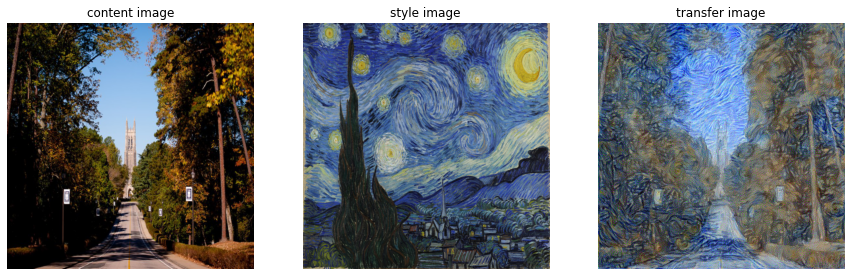

In [62]:
combine_img = image_loader(content_image).cuda()
content_layers = ['conv4_2',]
style_layers = ['conv1_1', 
                'conv1_2', 
                'conv2_1', 
                'conv3_1',
                'conv4_1',]

learning_rate = 1
max_epoch = 500
alpha = 1
beta = 500
style_weight = [0.3,0.3,0.2,0.1,0.1]

combine_img = style_transfer_train(model, features, combine_img,
                    content_features, style_features, content_layers, style_layers, 
                    learning_rate, max_epoch, alpha, beta, style_weight)
final_compare_show(content_img, style_img, combine_img)